<a href="https://colab.research.google.com/github/kadijairus/cnn_xray/blob/main/Practice_CNN_IHB0002_medium_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### OBJECTIVE
A CNN-based diagnosis of pediatric pneumonia using chest X-ray images.

### BACKGROUND
The World Health Organization (WHO) states that pneumonia is the leading cause of death among children under five, claiming approximately 2 million young lives annually. This exceeds the fatalities from HIV/AIDS, malaria, and measles combined. Nearly all (95%) new cases of clinical pneumonia in children are reported in developing regions, especially in Southeast Asia and Africa. Pneumonia can be caused by either bacterial or viral pathogens, necessitating distinct approaches to treatment. Bacterial pneumonia demands immediate antibiotic therapy following urgent referral, whereas viral pneumonia is managed with supportive care. Thus, prompt and accurate diagnosis is crucial. Radiographic data plays a vital role in diagnosis, with chest X-rays being a common method to help identify the type of pneumonia. However, in areas most affected by childhood pneumonia, where death rates are also the highest, quick analysis of these images is often unavailable.

### DATA
Labeled chest X-Ray images for pneumonia classification (source: https://data.mendeley.com/datasets/rscbjbr9sj/2)

The information regarding the chest X-ray images used to train and test the AI system can be restructured as follows:

Total Chest X-ray Images: **5,856**

- Train (5,232 images):
  - Pneumonia Cases: 3,883
    - Bacterial: 2,538
    - Viral: 1,345
  - Normal Cases: 1,349
- Test (624):
  - Pneumonia Cases: 390
    - Bacterial: 242
    - Viral: 148
  - Normal Cases: 234


### METHOD
Utilize TensorFlow to develop and train a Convolutional Neural Network (CNN) architecture aimed at classifying images.

- Explore different CNN architectures to identify the most effective structure for our classification task.

- Hyperparameter Tuning:
  - Conduct a systematic search for the optimal set of hyperparameters, including learning rate, batch size, and number of epochs. This process may involve using techniques such as grid search or random search to efficiently explore the hyperparameter space.
  - Test various optimizers such as Adam, SGD, and RMSprop to find the best algorithm for minimizing the loss function. The choice of optimizer can significantly impact the speed and quality of the training process.

- Implement a validation strategy to monitor the model's performance on unseen data during training.

In [1]:
"""Imports modules and creates directory for files."""


import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, Dropout, MaxPooling2D, AveragePooling2D, Flatten, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.metrics import Precision, Recall
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
import pytz

from google.colab import drive
drive.mount('/content/drive')


# Makes directory for statistics
tallinn_tz = pytz.timezone('Europe/Tallinn')
today = datetime.now(tallinn_tz).strftime("%Y-%m-%d_%H-%M")
report_dir = f'/content/drive/MyDrive/TalTech/3_semester/Sugav6pe_tervishoius/Praktikum_1/{today}_Model_training'
!mkdir -p {report_dir}

Mounted at /content/drive


In [2]:
"""Defines the CNN model."""


def create_cnn(input_shape, num_classes):
  """
  Define model architecture.

  :param int: height, width, channels
  :param int: number of classes
  :return: model
  """
  model = Sequential()
  # Convolutional layer with ReLU activation. 32 (pow of two) filters. 3x3 filter size. Input shape is picture resolution.
  model.add(Conv2D(32, (4, 4), activation='relu', input_shape=input_shape))
  # Max pooling layer
  model.add(MaxPooling2D((2, 2)))
  # Additional convolutional layer
  model.add(Conv2D(64, (4, 4), activation='relu'))
  model.add(MaxPooling2D((2, 2)))
  # Additional convolutional layer
  model.add(Conv2D(64, (4, 4), activation='relu'))

  # Flatten the output and add dense layers
  model.add(Flatten())
  # 64 is number of neurons.
  model.add(Dense(64, activation='relu'))
  # Output layer with softmax activation
  model.add(Dense(num_classes, activation='softmax'))

  return model


In [3]:
""" Defines the pre-trained Xception model """


from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import GlobalAveragePooling2D


def create_xception(input_shape, num_classes):
  """
  Define model architecture.

  :param int: height, width, channels
  :param int: number of classes
  :return: model
  """
  # Load Xception base without top layers
  base_model = Xception(
      include_top=False,
      weights="imagenet",
      input_shape=(input_shape)
  )

  # Only train last layers
  base_model.trainable = False

  # Add custom top layers
  model = Sequential([
      base_model,
      GlobalAveragePooling2D(),
      Dense(32, activation='relu'),
      Dense(num_classes, activation='softmax')
  ])
  return model


83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ xception (Functional)                │ (None, 5, 5, 2048)          │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │          65,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │              66 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,927,114 (79.83 MB)

 Trainable params: 65,634 (256.38 KB)

 Non-trainable params: 20,861,480 (79.58 MB)

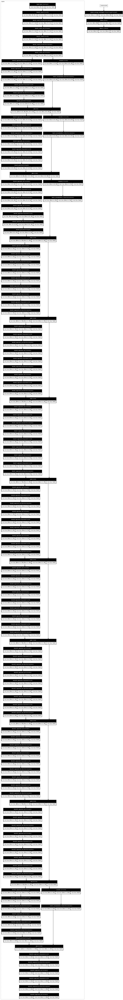

In [4]:
"""Specifies variables, compiles model and creates summary."""


# Adjustable parameters. Specified based on input pictures and classes.
input_shape = (150, 150, 3)
num_classes = 2
model = create_xception(input_shape, num_classes)
# model = create_cnn(input_shape, num_classes)

# Compiles the model 'adam' or 'sgd' optimizer
model.compile(optimizer='sgd',
              loss='categorical_crossentropy',
              metrics=['accuracy', Precision(), Recall()])

# Saves model summary in table format
summary_file = f"{report_dir}/{today}_Model_architecture_summary_optimizer_sgd.txt"
with open(summary_file, 'w') as f:
    model.summary(print_fn=lambda x: f.write(x + '\n'))
# Shows the model
model.summary()

# Shows model as a graph
tf.keras.utils.plot_model(
    model,
    to_file=f"{report_dir}/{today}_Model_graph_optimizer_sgd.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,
    dpi=60,
)


output size (feature map dimension): $\frac{n-f +2p}{s} + 1$

Number of parameters = (number of neurons in previous layer + 1) × number of neurons in current layer

Number of parameters in conv_layer: $(f*f*l+1)*k$, where $l$ and $k$ are the number of feature maps (input vs output)

(filter width × filter height × depth of the input + 1) × number of filters in the current layer

NOTE: Padding="same" in **Keras** does not mean the spatial dimensions do not change. **Keras** does not always pad symmetrically. When the filter size is odd, Keras adds more padding to one side than the other. This could lead to slightly asymmetrical padding around the input.

If you have an input size of 7x7 (49 elements) and you use a kernel size of 3x3 with a stride of 2, the exact output dimension calculation (ignoring padding for a moment) would be 3.5x3.5, because (7-3)/2 + 1 = 3.5. Since you can't have half a unit of output in one dimension, Keras applies "same" padding, which in this case involves adding extra padding to ensure the kernel can start at the first input unit and stride across the entire input space, rounding up the output dimensions to ensure full coverage.

So, when dealing with "same" padding and non-integer multiples of strides or when the division of input size by stride doesn't result in an integer, Keras (and similar frameworks) effectively "round up" the output dimension calculation to ensure that the entire input is covered and the output size is as close as possible to what the "same" padding policy promises.

In [5]:
"""Defines generating of data."""


from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define a training image data generator with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Rescale pixel values: 0 to 1, not to 255.
    rotation_range=20,  # Random rotations, 20 degrees.
    width_shift_range=None,  # Random horizontal shifts
    height_shift_range=0.2,  # Random vertical shifts
    shear_range=0.2,  # Shearing (darkness)
    zoom_range=0.2,  # Zooming
    horizontal_flip=True,  # Horizontal flipping
    fill_mode='nearest'
)

# Defines a testing/validation image data generator with NO augmentation, only rescaling
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)


In [6]:
"""Generates training, validation and testing data."""


batch_size = 32
target_size=(150, 150)

# Paths to directories
train_dir = '/content/drive/My Drive/chest_xray_medium/train'
val_dir =  '/content/drive/My Drive/chest_xray_medium/val'
test_dir = '/content/drive/My Drive/chest_xray_medium/test'

# Changes parameters after each batch
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

# Loads images from the testing directory
val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',  # Matching the class_mode of the training data
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Ensure the generator does not shuffle the images
)


Found 1281 images belonging to 2 classes.
Found 417 images belonging to 2 classes.
Found 417 images belonging to 2 classes.


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Nov  4 08:55:31 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P0              26W /  70W |   2181MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

Epoch 1/70


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 824s 18s/step - accuracy: 0.6831 - loss: 0.5662 - precision: 0.6831 - recall: 0.6831 - val_accuracy: 0.7837 - val_loss: 0.4366 - val_precision: 0.7837 - val_recall: 0.7837
Epoch 2/70
 1/40 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9062 - loss: 0.2181 - precision: 0.9062 - recall: 0.9062

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.9062 - loss: 0.2181 - precision: 0.9062 - recall: 0.9062 - val_accuracy: 1.0000 - val_loss: 0.2265 - val_precision: 1.0000 - val_recall: 1.0000
Epoch 3/70
40/40 ━━━━━━━━━━━━━━━━━━━━ 38s 810ms/step - accuracy: 0.8623 - loss: 0.2990 - precision: 0.8623 - recall: 0.8623 - val_accuracy: 0.9303 - val_loss: 0.2263 - val_precision: 0.9303 - val_recall: 0.9303
Epoch 4/70
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - accuracy: 0.8750 - loss: 0.2196 - precision: 0.8750 - recall: 0.8750 - val_accuracy: 1.0000 - val_loss: 0.2255 - val_precision: 1.0000 - val_recall: 1.0000
Epoch 5/70
40/40 ━━━━━━━━━━━━━━━━━━━━ 37s 809ms/step - accuracy: 0.8772 - loss: 0.2819 - precision: 0.8772 - recall: 0.8772 - val_accuracy: 0.8798 - val_loss: 0.2538 - val_precision: 0.8798 - val_recall: 0.8798
Epoch 6/70
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8125 - loss: 0.3960 - precision: 0.8125 - recall: 0.8125 - val_accuracy: 1.0000 - val_loss: 0.3061 - val_pr

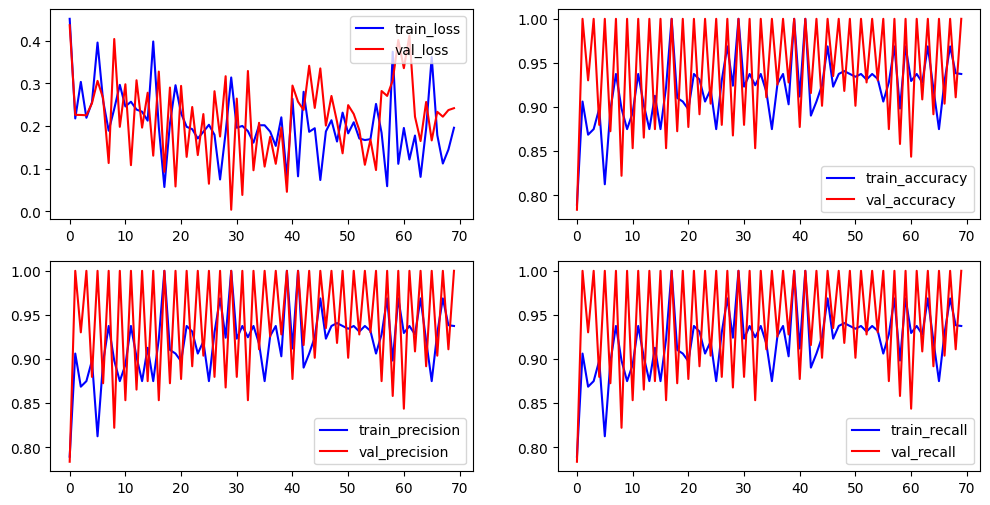

In [7]:
"""Trains and tests the model and writes results to file."""


import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import Callback
from sklearn.metrics import classification_report

number_of_epochs = 70

# Fit the model to the training data
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Ensures the model sees the x_train samples per epoch
                                                                            # allows you to control how much data the model
                                                                            # should consume before declaring one epoch complete and moving on to the next epoch.
    epochs=number_of_epochs,  # Number of epochs to train for
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size
)

keys = model.history.history.keys()
print(f"Model history keys are: \n{keys}")


# Generate plots
f,ax=plt.subplots(2,2, figsize=(12,6))
try:
  #1st subplot: training loss and validation loss
  ax[0, 0].plot(model.history.history['loss'],color='b',label='train_loss')
  ax[0, 0].plot(model.history.history['val_loss'],color='r',label='val_loss')
  ax[0, 0].legend(loc="upper right")
except Exception as e:
    print(f'Creating plot 0,0 failed: {e}')

try:
  #2nd subplot: training accuracy and validation accuracy
  ax[0, 1].plot(model.history.history['accuracy'],color='b',label='train_accuracy')
  ax[0, 1].plot(model.history.history['val_accuracy'],color='r',label='val_accuracy')
  ax[0, 1].legend(loc="lower right")
except Exception as e:
    print(f'Creating plot 0,1 failed: {e}')

try:
  #3rd subplot: training precision and validation precision
  ax[1, 0].plot(model.history.history['precision'],color='b',label='train_precision')
  ax[1, 0].plot(model.history.history['val_precision'],color='r',label='val_precision')
  ax[1, 0].legend(loc="lower right")
except Exception as e:
    print(f'Creating plot 1,0 failed: {e}')

try:
  #4th subplot: training recall and validation recall
  ax[1, 1].plot(model.history.history['recall'],color='b',label='train_recall')
  ax[1, 1].plot(model.history.history['val_recall'],color='r',label='val_recall')
  ax[1, 1].legend(loc="lower right")
except Exception as e:
    print(f'Creating plot 1,1 failed: {e}')


# Save plots to drive
filename = f"{report_dir}/{today}_CNN_training_plot_{number_of_epochs}_epochs_batch_{batch_size}_optimizer_sgd.png"
try:
    plt.savefig(filename)
    print('Saved figure')
except Exception as e:
    print(f'Saving figure to first location failed: {e}')
    try:
      plt.savefig(f'/content/drive/MyDrive/{filename}')
      print('Saved figure')
    except Exception as e:
      print(f'Saving figure failed: {e}')


- **Sensitivity (Recall)**:
  
  $$\text{Sensitivity} = \frac{TP}{TP + FN}$$

- **Specificity**:
  
  $$\text{Specificity} = \frac{TN}{TN + FP}$$

- **Precision**:
  
  $$\text{Precision} = \frac{TP}{TP + FP}$$



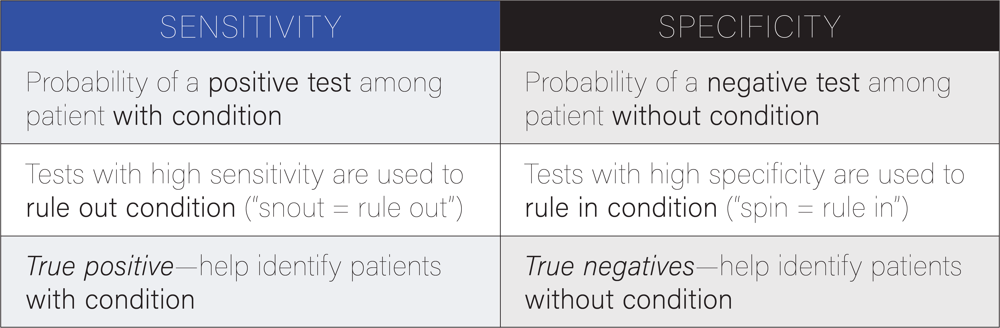

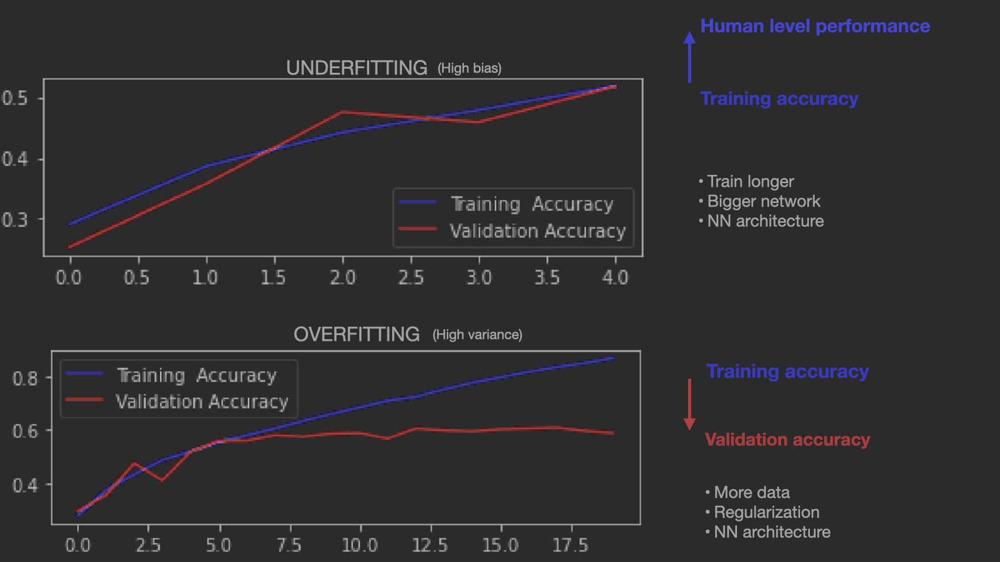

14/14 ━━━━━━━━━━━━━━━━━━━━ 269s 20s/step
Test generator class indicies:
 {'NORMAL': 0, 'PNEUMONIA': 1}
Accuracy: 0.8489208633093526

Classification Report:
               precision    recall  f1-score   support

      NORMAL       0.83      0.89      0.85       209
   PNEUMONIA       0.88      0.81      0.84       208

    accuracy                           0.85       417
   macro avg       0.85      0.85      0.85       417
weighted avg       0.85      0.85      0.85       417

Confusion matrix: [[185  24]
 [ 39 169]]


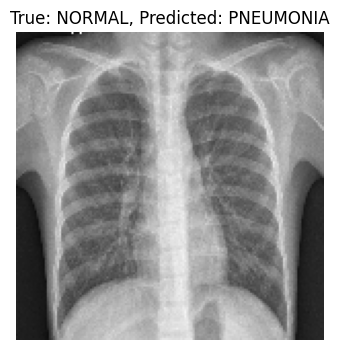

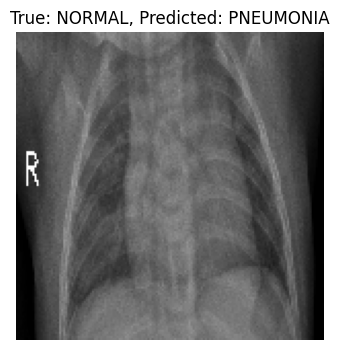

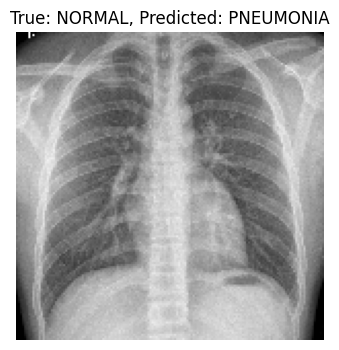

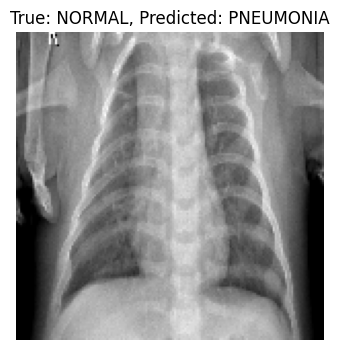

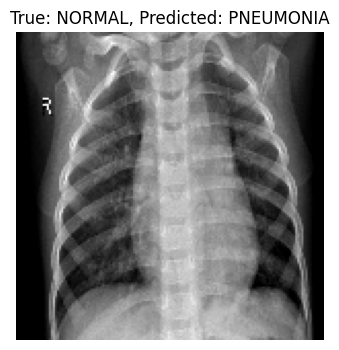

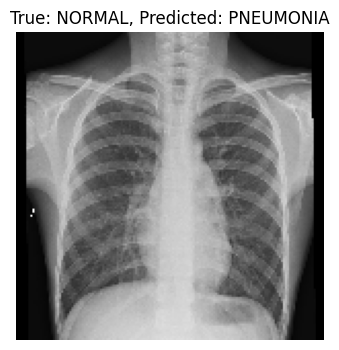

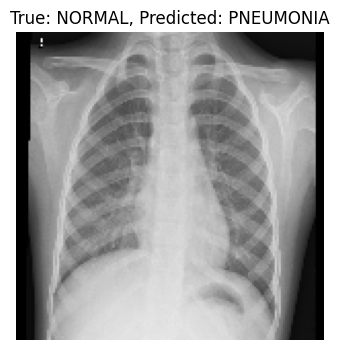

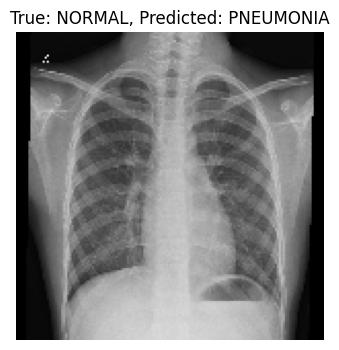

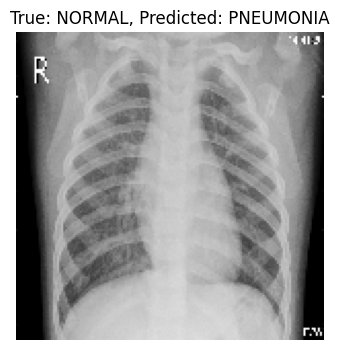

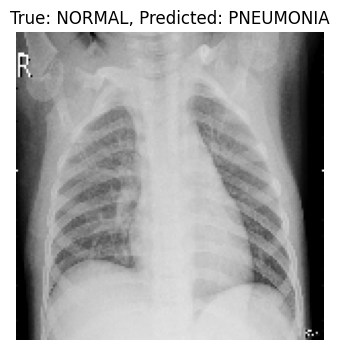

In [8]:
""" Test model"""


import numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)
true_labels = test_generator.classes

print(f"Test generator class indicies:\n {test_generator.class_indices}")

accuracy = accuracy_score(true_labels, predicted_classes)
print(f"Accuracy: {accuracy}")


# Get true labels from the generator
true_classes = test_generator.classes[:len(predicted_classes)]
class_labels = list(test_generator.class_indices.keys())

# Generate a detailed classification report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print("\nClassification Report:\n", report)
confusion_matrix = confusion_matrix(true_labels, predicted_classes)
print(f"Confusion matrix: {confusion_matrix}")

filename = f"{report_dir}/{today}_classification_report_batch_{batch_size}_optimizer_sgd.txt"
try:
  with open(filename, 'w') as f:
      f.write("Classification Report\n")
      f.write(report)

      f.write(f"\nAccuracy: {accuracy:.4f}\n")

      # Add the confusion matrix to the report
      f.write("\nConfusion Matrix:\n")
      for row in confusion_matrix:
          f.write(' '.join(map(str, row)) + '\n')
except Exception as e:
    print(f'Saving report failed: {e}')


incorrect_indices = np.where(predicted_classes != true_labels)[0]


# Reset the generator to start from the beginning
test_generator.reset()

# Initialize a counter for plotting
num_samples_to_plot = 10  # Number of incorrect samples to display
plotted_count = 0

# Iterate over batches in the test generator
for i in range(len(test_generator)):
    # Get a batch of images and labels
    images, labels = next(test_generator)

    if len(images) == 0:  # Skip empty batches
        continue

    # Determine the indices of images in this batch that are incorrect
    batch_start_index = i * test_generator.batch_size
    batch_end_index = batch_start_index + len(labels)

    # Filter incorrect indices that are in the current batch range
    batch_incorrect_indices = [idx for idx in incorrect_indices
                               if batch_start_index <= idx < batch_end_index]

    # Adjust indices relative to the current batch
    batch_relative_indices = [idx - batch_start_index for idx in batch_incorrect_indices]

    # Plot incorrect images from the current batch
    for idx in batch_relative_indices:
        if plotted_count >= num_samples_to_plot:
            break

        # Rescale the image if necessary for correct display
        plt.figure(figsize=(4, 4))
        plt.imshow((images[idx] * 255).astype("uint8"))  # Adjust for 0-255 range if needed
        true_class = list(test_generator.class_indices.keys())[true_labels[batch_start_index + idx]]
        predicted_class = list(test_generator.class_indices.keys())[predicted_classes[batch_start_index + idx]]

        plt.title(f"True: {true_class}, Predicted: {predicted_class}")
        plt.axis('off')

        plot_filename = f"{report_dir}/Wrong_prediction_{plotted_count + 1}_{true_class}_predicted_{predicted_class}.png"
        plt.savefig(plot_filename, format='png')

        plt.show()

        plotted_count += 1

    if plotted_count >= num_samples_to_plot:
        break

In [ ]:
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_2 (Dense)             (None, 32)                65568     
                                                                 
 dense_3 (Dense)             (None, 2)                 66        
                                                                 
Total params: 20927114 (79.83 MB)
Trainable params: 65634 (256.38 KB)
Non-trainable params: 20861480 (79.58 MB)
_________________________________________________________________


In [ ]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # Ensures the model sees the x_train samples per epoch
    epochs=20,  # Number of epochs to train for
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size  # Ensures the model sees the x_val samples per validation step
)

Epoch 1/20
18/18 [==============================] - 50s 1s/step - loss: 0.3586 - accuracy: 0.8680 - val_loss: 3.4988 - val_accuracy: 0.8229
Epoch 2/20
18/18 [==============================] - 16s 883ms/step - loss: 0.1970 - accuracy: 0.9401 - val_loss: 1.6049 - val_accuracy: 0.8958
Epoch 3/20
18/18 [==============================] - 17s 926ms/step - loss: 0.1467 - accuracy: 0.9462 - val_loss: 2.5411 - val_accuracy: 0.8958
Epoch 4/20
18/18 [==============================] - 17s 936ms/step - loss: 0.1922 - accuracy: 0.9366 - val_loss: 1.2207 - val_accuracy: 0.9062
Epoch 5/20
18/18 [==============================] - 17s 921ms/step - loss: 0.1121 - accuracy: 0.9701 - val_loss: 1.0443 - val_accuracy: 0.8021
Epoch 6/20
18/18 [==============================] - 17s 916ms/step - loss: 0.1154 - accuracy: 0.9618 - val_loss: 0.7464 - val_accuracy: 0.8958
Epoch 7/20
18/18 [==============================] - 16s 909ms/step - loss: 0.1013 - accuracy: 0.9754 - val_loss: 8.8825 - val_accuracy: 0.5625
Ep

---



**Batch Normalization** [Paper](https://arxiv.org/pdf/1502.03167.pdf)


1. Speeds up training.
2. Makes initial weights less important.
3. Acts as a regularizer in some sence.

---

**Dropout** [Paper](https://www.cs.toronto.edu/~rsalakhu/papers/srivastava14a.pdf)

The purpose of Dropout is to prevent overfitting in neural networks. It works by randomly selecting a subset of units (not weights) to be ignored or "dropped out" during training. This random elimination of units encourages the network to become less sensitive to the specific weights of neurons and improves the network's ability to generalize from the training data to unseen data.

`Dropout(0.5)`

The "probability" refers to the dropout rate, which is the fraction of the input units to drop during training. This rate is specified as a decimal between 0 and 1. For example, a dropout rate of 0.5 means that there is a 50% chance that any given unit (neuron) will be dropped (i.e., temporarily removed) from the network during a particular forward or backward pass.

`Convolution/Dense -> Activation -> Dropout`

---


In [1]:
modelAlexNet = Sequential([
    Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(150,150,3)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='same'),
    Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='same'),
    Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    BatchNormalization(),
    Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    BatchNormalization(),
    Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='same'),
    Flatten(),
    Dense(4096, activation='relu'),
    Dropout(0.5),
    Dense(4096, activation='relu'),
    Dropout(0.5),
    Dense(2, activation='softmax')
])

NameError: name 'Sequential' is not defined

In [3]:
modelAlexNet.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

modelAlexNet.summary()

NameError: name 'modelAlexNet' is not defined

Visualization of gradient decent optimization algorithms: https://github.com/j-w-yun/optimizer-visualization

In [1]:
import os
import time
from tensorboard.plugins.hparams import api as hp


root_logdir = os.path.join(os.curdir, "logs")
run_name = ''

def get_run_logdir():
    run_id = time.strftime("run_" + run_name + "_%Y_%m_%d-%H_%M_%S")
    return os.path.join(root_logdir, run_id)

In [ ]:
HP_LEARNING_RATE = hp.HParam('learning_rate', hp.Discrete([1e-1, 1e-4]))
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([32, 64 ]))
HP_DROPOUT = hp.HParam('dropout', hp.Discrete([0.3, 0.5]))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd']))
METRIC_ACCURACY = 'accuracy'

In [2]:
with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_LEARNING_RATE, HP_OPTIMIZER],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

NameError: name 'tf' is not defined

In [ ]:
def train_test_model(hparams):
    optimizer_name = hparams[HP_OPTIMIZER]
    learning_rate = hparams[HP_LEARNING_RATE]
    if optimizer_name == "adam":
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_name == "sgd":
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimizer_name == 'RMSprop':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        raise ValueError("unexpected optimizer name: %r" % (optimizer_name,))

    model = Sequential([
        Conv2D(filters=96, kernel_size=(11, 11), strides=(4, 4), activation='relu', padding='same',
                            input_shape=(150, 150, 1)),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
        Conv2D(filters=256, kernel_size=(5, 5), strides=(1, 1), activation='relu', padding="same"),
        BatchNormalization(),
        MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
        Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), activation='relu', padding="same"),
        BatchNormalization(),
        Conv2D(filters=384, kernel_size=(1, 1), strides=(1, 1), activation='relu', padding="same"),
        BatchNormalization(),
        Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation='relu', padding="same"),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same'),
        Flatten(),
        Dense(4096, activation='relu', input_dim=(227, 227, 1)),
        Dropout(hparams[HP_DROPOUT]),
        Dense(4096, activation='relu'),
        Dropout(hparams[HP_DROPOUT]),
        Dense(1000, activation='relu'),
        Dropout(hparams[HP_DROPOUT]),
        Dense(2, activation='softmax')
    ])

    model.compile(
      optimizer=optimizer,
      loss='categorical_crossentropy',
      metrics=['accuracy'],
    )
    logdir = get_run_logdir()
    model.fit(train_generator, epochs=20, validation_data=(val_generator), callbacks=[
        tf.keras.callbacks.TensorBoard(logdir),  # log metrics
        hp.KerasCallback(logdir, hparams)])  # log hparams
    _, accuracy = model.evaluate(test_generator)
    return accuracy

In [ ]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)


session_num = 0

#for num_units in HP_NUM_UNITS.domain.values:
    #for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
for dropout_rate in HP_DROPOUT.domain.values:
  for optimizer in HP_OPTIMIZER.domain.values:
    for learning_rate in HP_LEARNING_RATE.domain.values:
        hparams = {HP_LEARNING_RATE: learning_rate,
        #HP_NUM_UNITS: num_units,
        HP_DROPOUT: dropout_rate,
        HP_OPTIMIZER: optimizer,
        }
        run_name = "run-%d" % session_num
        print('--- Starting trial: %s' % run_name)
        print({h.name: hparams[h] for h in hparams})
        run('logs/hparam_tuning/' + run_name, hparams)
        session_num += 1


--- Starting trial: run-0
{'learning_rate': 0.0001, 'dropout': 0.3, 'optimizer': 'adam'}
Epoch 1/20


ValueError: Exception encountered when calling Sequential.call().

[1mInput 0 of layer "conv2d_24" is incompatible with the layer: expected axis -1 of input shape to have value 1, but received input with shape (None, 150, 150, 3)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(None, 150, 150, 3), dtype=float32)
  • training=True
  • mask=None

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/hparam_tuning


<IPython.core.display.Javascript object>